In [2]:
import csv
import numpy as np
from matplotlib import pyplot as plt
import os
import pandas as pd
from sklearn.decomposition import PCA
import seaborn as sns

In [3]:
results_mri = "../results_0903.csv"
clinical_data = "../dataset_riemer_lastrevision_february27th.xlsx"
clinical_data_explanations = "../explanations_riemer_lastrevision_february27th.xlsx"
t1we_image_folder = "/Users/signehogstad/masterproject/T1WE_2802"

## Read file with MRI data

In [4]:
with open(results_mri) as csv_file:
    csv_reader = csv.reader(csv_file, delimiter=',')
    results = []
    for row in csv_reader:
        for i_col in range(230):
        
            results.append([])
            results[i_col].append(row[i_col])

In [5]:
df = pd.read_csv(results_mri, index_col=[0,1])
# Calculate the correlation matrix
corr = df.corr()
print(df)


                        SN CROWN_PD_MAP  SN_R CROWN_PD_MAP  SN_L CROWN_PD_MAP  \
personal_id patient_id                                                          
01-0002     0000997A            668.026         671.701887         663.880851   
01-0003     0000991B            686.626         685.528302         687.863830   
01-0004     0000DAD2            645.394         642.109434         649.097872   
01-0005     00006431            675.596         664.422642         688.195745   
01-0006     00001573            700.828         698.554717         703.391489   
...                                 ...                ...                ...   
02-0012     000040B3            648.066         648.701887         647.348936   
02-0021     00008C1B            663.218         635.773585         694.165957   
02-0023     0000CAAB            644.144         641.052830         647.629787   
02-0024     000090BE            680.552         677.833962         683.617021   
02-0028     00008289        

<AxesSubplot:>

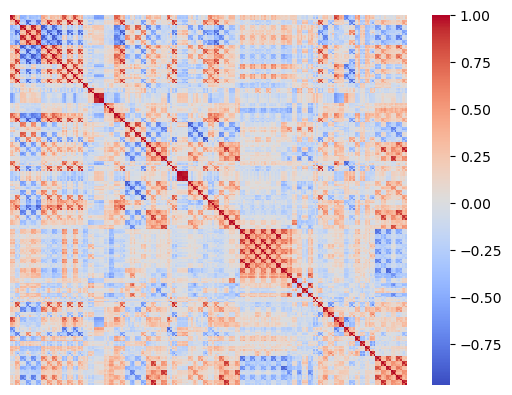

In [6]:
sns.heatmap(corr, cmap='coolwarm', xticklabels=False, yticklabels=False)

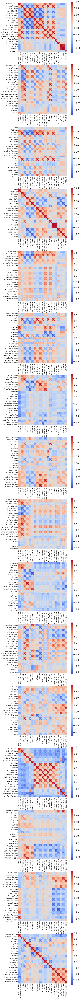

In [7]:
# Divide the correlation matrix into 16 subplots
f, ax = plt.subplots(16, figsize=(10, 160))

# Plot the heatmaps in the subplots
sns.set(font_scale=2)
sns.heatmap(corr.iloc[:57,:57], ax=ax[0], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[:57,57:114], ax=ax[1], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[57:114,:57], ax=ax[2], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[57:114,57:114], ax=ax[3], cmap='coolwarm', square=True)

sns.heatmap(corr.iloc[114:171,:57], ax=ax[4], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[171:,:57], ax=ax[5], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[114:171,57:114], ax=ax[6], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[171:,57:114], ax=ax[7], cmap='coolwarm', square=True)

sns.heatmap(corr.iloc[:57,114:171], ax=ax[8], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[57:114,114:171], ax=ax[9], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[:57,171:], ax=ax[10], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[57:114,171:], ax=ax[11], cmap='coolwarm', square=True)

sns.heatmap(corr.iloc[114:171,114:171], ax=ax[12], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[171:,114:171], ax=ax[13], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[114:171,171:], ax=ax[14], cmap='coolwarm', square=True)
sns.heatmap(corr.iloc[171:,171:], ax=ax[15], cmap='coolwarm', square=True)

# Show the plot
plt.show()


In [8]:
print(df.shape)

# Feature matrix
X = df.values
print(X)

(81, 228)
[[668.026    671.701887 663.880851 ... 194.482143 181.614286 207.35    ]
 [686.626    685.528302 687.86383  ... 209.310714 209.642857 208.978571]
 [645.394    642.109434 649.097872 ... 235.475    234.142857 236.807143]
 ...
 [644.144    641.05283  647.629787 ... 234.010714 240.364286 227.657143]
 [680.552    677.833962 683.617021 ... 233.189286 230.278571 236.1     ]
 [658.166    658.69434  657.570213 ... 201.764286 201.55     201.978571]]


In [9]:
print(df.index)

MultiIndex([('01-0002', '0000997A'),
            ('01-0003', '0000991B'),
            ('01-0004', '0000DAD2'),
            ('01-0005', '00006431'),
            ('01-0006', '00001573'),
            ('01-0007', '0000F8F8'),
            ('01-0008', '0000CC09'),
            ('01-0009', '00003848'),
            ('01-0010', '0000565C'),
            ('01-0011', '00000A67'),
            ('01-0012', '00004510'),
            ('01-0013', '0000EF8B'),
            ('01-0014', '00004E2A'),
            ('01-0015', '00005316'),
            ('01-0016', '0000F262'),
            ('01-0017', '0000D2D0'),
            ('01-0018', '000037D3'),
            ('01-0019', '00007CE3'),
            ('01-0020', '0000F810'),
            ('01-0021', '000038BE'),
            ('01-0022', '0000F633'),
            ('01-0023', '00000172'),
            ('01-0024', '0000AA56'),
            ('01-0025', '000090DC'),
            ('01-0026', '0000C65E'),
            ('01-0027', '000096EB'),
            ('01-0029', '0000868E'),
 

### Standardise

In [10]:
from sklearn.preprocessing import StandardScaler

# Create the object
scaler = StandardScaler()
# Calculate the mean and standard deviation
scaler.fit(X)
# Transform the values
X_scaled = scaler.transform(X)

### Choose the right number of dimensions

In [11]:
from sklearn.decomposition import PCA 

pca_228 = PCA(n_components=None, random_state=2020)
pca_228.fit(X_scaled)
X_pca_228 = pca_228.transform(X_scaled)
print("Variance explained by all principal components: ")
print(sum(pca_228.explained_variance_ratio_ * 100))

Variance explained by all principal components: 
99.99999999999997


In [12]:
pca_228.explained_variance_ratio_ * 100

array([2.04414687e+01, 1.22990292e+01, 1.06571734e+01, 7.78163989e+00,
       6.36391320e+00, 5.15353109e+00, 4.18795291e+00, 3.67567145e+00,
       3.17835852e+00, 2.61640182e+00, 2.53711048e+00, 2.11686001e+00,
       1.82204479e+00, 1.61402621e+00, 1.39066673e+00, 1.34206621e+00,
       1.21519292e+00, 1.12537207e+00, 9.81156202e-01, 9.09776171e-01,
       8.05020892e-01, 6.93269509e-01, 5.91653319e-01, 5.71805674e-01,
       5.35220328e-01, 4.86909823e-01, 4.40141402e-01, 3.86653506e-01,
       3.51888340e-01, 3.33769588e-01, 3.08128957e-01, 2.95531038e-01,
       2.63351429e-01, 2.21908980e-01, 2.09039498e-01, 1.85741698e-01,
       1.71233161e-01, 1.58945074e-01, 1.47494890e-01, 1.31000915e-01,
       1.15197215e-01, 1.09486756e-01, 1.00983941e-01, 9.21863432e-02,
       8.88879641e-02, 7.33231878e-02, 6.53419090e-02, 6.26038618e-02,
       5.59157539e-02, 4.71745049e-02, 4.57550407e-02, 4.45541762e-02,
       3.91440574e-02, 3.64400404e-02, 3.58246552e-02, 3.21214183e-02,
      

In [13]:
# Cumulative explained variance [%]
np.cumsum (pca_228.explained_variance_ratio_ * 100)

array([ 20.44146873,  32.74049797,  43.39767138,  51.17931127,
        57.54322447,  62.69675556,  66.88470847,  70.56037992,
        73.73873844,  76.35514026,  78.89225074,  81.00911075,
        82.83115554,  84.44518175,  85.83584848,  87.17791469,
        88.39310761,  89.51847967,  90.49963587,  91.40941204,
        92.21443294,  92.90770244,  93.49935576,  94.07116144,
        94.60638177,  95.09329159,  95.53343299,  95.9200865 ,
        96.27197484,  96.60574442,  96.91387338,  97.20940442,
        97.47275585,  97.69466483,  97.90370433,  98.08944603,
        98.26067919,  98.41962426,  98.56711915,  98.69812007,
        98.81331728,  98.92280404,  99.02378798,  99.11597432,
        99.20486228,  99.27818547,  99.34352738,  99.40613124,
        99.462047  ,  99.5092215 ,  99.55497654,  99.59953072,
        99.63867478,  99.67511482,  99.71093947,  99.74306089,
        99.7713118 ,  99.79814356,  99.82131735,  99.84383799,
        99.86197047,  99.87848975,  99.89409844,  99.90

Text(0, 0.5, 'Explained variance')

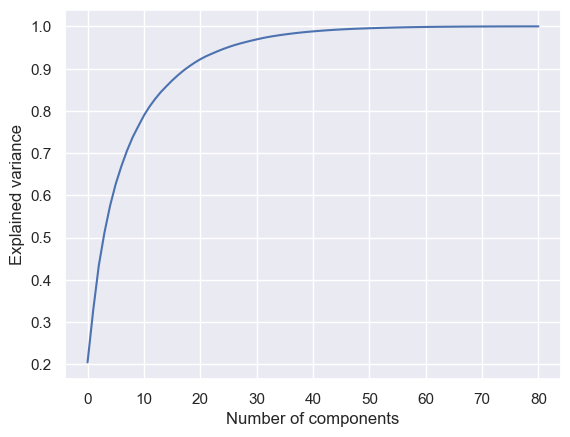

In [31]:
sns.set(font_scale=1)
plt.plot(np.cumsum(pca_228.explained_variance_ratio_))
plt.xlabel('Number of components')
plt.ylabel('Explained variance')

### Apply PCA by setting n_components=2

In [15]:
pca_2 = PCA(n_components=2, random_state=2020)
pca_2.fit(X_scaled)
X_pca_2 = pca_2.transform(X_scaled)

Text(0, 0.5, 'Second principal component')

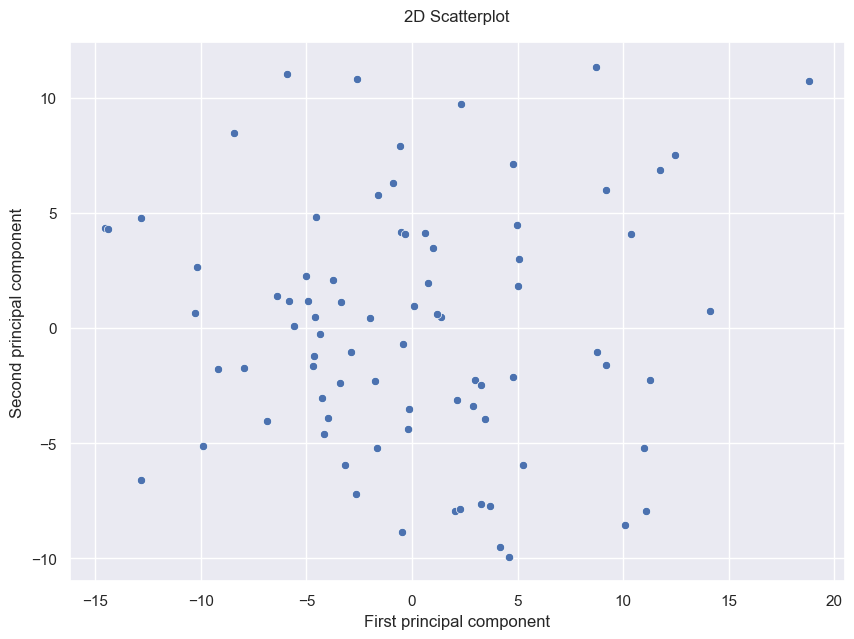

In [32]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca_2[:, 0], y=X_pca_2[:, 1])
plt.title("2D Scatterplot", pad=15)
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

### Apply PCA by setting n_components=3

In [17]:
pca_3 = PCA(n_components=3, random_state=2020)
pca_3.fit(X_scaled)
X_pca_3 = pca_3.transform(X_scaled)

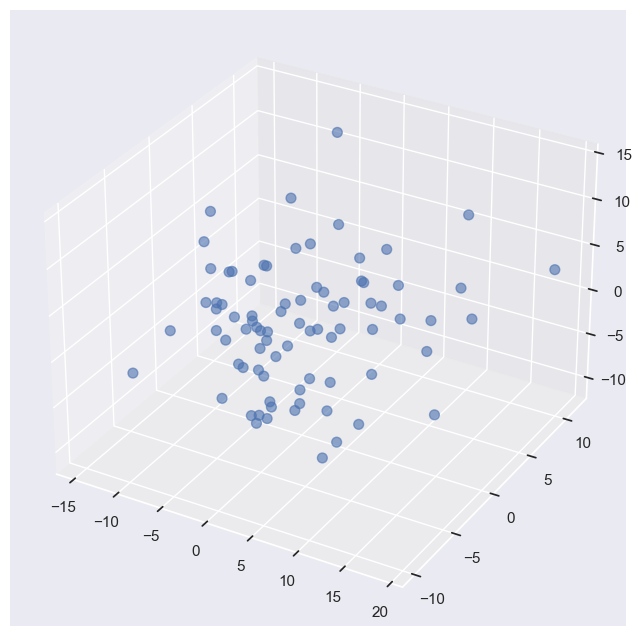

In [33]:
from mpl_toolkits import mplot3d

fig = plt.figure(figsize = (12, 8))
ax = plt.axes (projection='3d')
sctt = ax.scatter3D(X_pca_3[:, 0], X_pca_3[:, 1], X_pca_3[:, 2], s=50, alpha=0.6)

## Read file with clinical data

In [108]:
df_clinical_explanations = pd.read_excel(clinical_data_explanations)
df_clinical_explanations.columns

Index(['id', 'id ', 'status', 'gender', 'yearofbirth', 'ageatbaseline',
       'yearofdiagnosis', 'ageatonset_diagnosis', 'ageatonset_symptoms',
       'diseaseduration', 'mdsupdrsI', 'mdsupdrsII', 'mdsupdrsIIIcalc',
       'mdsupdrsIV', 'mdsupdrstotalcalc', 'tdpigdphenotype', 'hoehnyahr',
       'mdsnmstotal', 'mdsnmsnmf', 'moca', 'bsit'],
      dtype='object')

In [143]:
df_clinical = pd.read_excel(clinical_data, header=None, index_col=[0,1])
df_clinical.columns = df_clinical_explanations.columns[2:]
df_clinical.head()

,,status,gender,yearofbirth,ageatbaseline,yearofdiagnosis,ageatonset_diagnosis,ageatonset_symptoms,diseaseduration,mdsupdrsI,mdsupdrsII,mdsupdrsIIIcalc,mdsupdrsIV,mdsupdrstotalcalc,tdpigdphenotype,hoehnyahr,mdsnmstotal,mdsnmsnmf,moca,bsit
0,1,,,,,,,,,,,,,,,,,,,
01-0002,01-0002,control,female,1954,67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.0,11.0
01-0003,01-0003,patient,female,1959,62,2017.0,58.0,57.0,50.0,12.0,4.0,13.0,7.0,36.0,td,2.0,NaN,NaN,25.0,7.0
01-0004,01-0004,control,male,1957,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0,10.0
01-0005,01-0005,patient,female,1952,68,2016.0,64.0,61.0,84.0,4.0,9.0,28.0,1.0,42.0,pigd,3.0,NaN,NaN,27.0,6.0
01-0006,01-0006,patient,female,1960,61,2017.0,57.0,58.0,36.0,6.0,3.0,29.0,0.0,38.0,td,2.0,NaN,NaN,27.0,5.0


In [111]:
df_clinical.shape

(81, 19)

In [112]:
df_clinical.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 81 entries, ('01-0002', '01-0002') to ('02-0028', '02-0028')
Data columns (total 19 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   2       81 non-null     object 
 1   3       81 non-null     object 
 2   4       81 non-null     int64  
 3   5       81 non-null     int64  
 4   6       38 non-null     float64
 5   7       38 non-null     float64
 6   8       54 non-null     float64
 7   9       54 non-null     float64
 8   10      53 non-null     float64
 9   11      53 non-null     float64
 10  12      56 non-null     float64
 11  13      55 non-null     float64
 12  14      51 non-null     float64
 13  15      54 non-null     object 
 14  16      56 non-null     float64
 15  17      52 non-null     float64
 16  18      52 non-null     float64
 17  19      78 non-null     float64
 18  20      76 non-null     float64
dtypes: float64(14), int64(2), object(3)
memory usage: 17.6+ KB


In [113]:
df_clinical.describe()

,4,5,6,7,8,9,10,11,12,13,14,16,17,18,19,20
count,81.000000,81.000000,38.000000,38.000000,54.000000,54.000000,53.000000,53.000000,56.000000,55.000000,51.000000,56.000000,52.000000,52.000000,78.000000,76.000000
mean,1952.864198,68.197531,2016.368421,64.500000,62.351852,74.981481,8.886792,8.471698,26.035714,2.309091,44.941176,1.982143,52.596154,0.538462,24.615385,7.157895
std,9.200208,9.117867,3.730235,9.457587,8.906553,40.300050,4.689023,5.849404,10.832551,2.949405,16.513524,0.485838,34.348422,1.552500,3.342877,2.828675
min,1936.000000,32.000000,2002.000000,30.000000,29.000000,14.000000,2.000000,1.000000,4.000000,0.000000,12.000000,1.000000,7.000000,0.000000,15.000000,0.000000
25%,1946.000000,63.000000,2015.000000,58.500000,58.000000,47.250000,5.000000,4.000000,19.750000,0.000000,36.000000,2.000000,28.500000,0.000000,23.000000,5.000000
50%,1952.000000,69.000000,2017.000000,64.000000,62.000000,69.000000,7.000000,7.000000,25.000000,1.000000,41.000000,2.000000,47.000000,0.000000,25.000000,8.000000
75%,1959.000000,75.000000,2019.000000,71.750000,69.000000,84.000000,12.000000,12.000000,30.250000,4.000000,56.000000,2.000000,64.250000,0.000000,27.000000,9.250000
max,1989.000000,84.000000,2020.000000,79.000000,77.000000,228.000000,23.000000,24.000000,57.000000,9.000000,90.000000,3.000000,181.000000,6.000000,31.000000,11.000000


In [114]:
df_clinical.isnull().sum()

2      0
3      0
4      0
5      0
6     43
7     43
8     27
9     27
10    28
11    28
12    25
13    26
14    30
15    27
16    25
17    29
18    29
19     3
20     5
dtype: int64

In [127]:
# Feature matrix
X = df_clinical.values
print(X)

[['control' 'female' 1954 ... nan 28.0 11.0]
 ['patient' 'female' 1959 ... nan 25.0 7.0]
 ['control' 'male' 1957 ... nan 27.0 10.0]
 ...
 ['patient' 'male' 1951 ... 0.0 22.0 9.0]
 ['control' 'female' 1947 ... nan 21.0 0.0]
 ['patient' 'female' 1943 ... 0.0 25.0 8.0]]


### Handle categorical values

In [128]:
for participant in X:
    if participant[0] == "control":
        participant[0] = 0
    else:
        participant[0] = 1

    if participant[1] == "female":
        participant[1] = 0
    else:
        participant[1] = 1

    if participant[13] == "td":
        participant[13] = 0
    elif participant[13] == "pigd":
        participant[13] = 1
    elif participant[13] == "indeterminate":
        participant[13] = 2
        
print(X)
new_df_clinical = pd.DataFrame(X)
new_df_clinical.head()

[[0 0 1954 ... nan 28.0 11.0]
 [1 0 1959 ... nan 25.0 7.0]
 [0 1 1957 ... nan 27.0 10.0]
 ...
 [1 1 1951 ... 0.0 22.0 9.0]
 [0 0 1947 ... nan 21.0 0.0]
 [1 0 1943 ... 0.0 25.0 8.0]]


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,0,0,1954,67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.0,11.0
1,1,0,1959,62,2017.0,58.0,57.0,50.0,12.0,4.0,13.0,7.0,36.0,0,2.0,NaN,NaN,25.0,7.0
2,0,1,1957,63,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.0,10.0
3,1,0,1952,68,2016.0,64.0,61.0,84.0,4.0,9.0,28.0,1.0,42.0,1,3.0,NaN,NaN,27.0,6.0
4,1,0,1960,61,2017.0,57.0,58.0,36.0,6.0,3.0,29.0,0.0,38.0,0,2.0,NaN,NaN,27.0,5.0


### Handle missing values

In [123]:
from sklearn.impute import SimpleImputer

imp_mean = SimpleImputer(missing_values=np.nan, strategy='constant')
X = imp_mean.fit_transform(X)
new_df_clinical = pd.DataFrame(X)
new_df_clinical.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,0,0,1954,67,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,28.0,11.0
1,1,0,1959,62,2017.0,58.0,57.0,50.0,12.0,4.0,13.0,7.0,36.0,0,2.0,missing_value,missing_value,25.0,7.0
2,0,1,1957,63,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,missing_value,27.0,10.0
3,1,0,1952,68,2016.0,64.0,61.0,84.0,4.0,9.0,28.0,1.0,42.0,1,3.0,missing_value,missing_value,27.0,6.0
4,1,0,1960,61,2017.0,57.0,58.0,36.0,6.0,3.0,29.0,0.0,38.0,0,2.0,missing_value,missing_value,27.0,5.0


In [133]:
corr = new_df_clinical.corr(numeric_only=False)
print(new_df_clinical)
#sns.heatmap(new_df_clinical, cmap='coolwarm')

TypeError: corr() got an unexpected keyword argument 'numeric_only'

In [77]:
# Create the object
scaler = StandardScaler()
# Calculate the mean and standard deviation
scaler.fit(X)
# Transform the values
X_scaled = scaler.transform(X)

pca = PCA(n_components=None, random_state=2020)
pca.fit(X_scaled)
X_pca = pca.transform(X_scaled)
print("Variance explained by all principal components: ")
print(sum(pca.explained_variance_ratio_ * 100))

Variance explained by all principal components: 
100.00000000000001


In [46]:
print(df.iloc[:,2])

0     control
1     patient
2     control
3     patient
4     patient
       ...   
76    control
77    control
78    patient
79    control
80    patient
Name: 2, Length: 81, dtype: object


Text(0, 0.5, 'Second principal component')

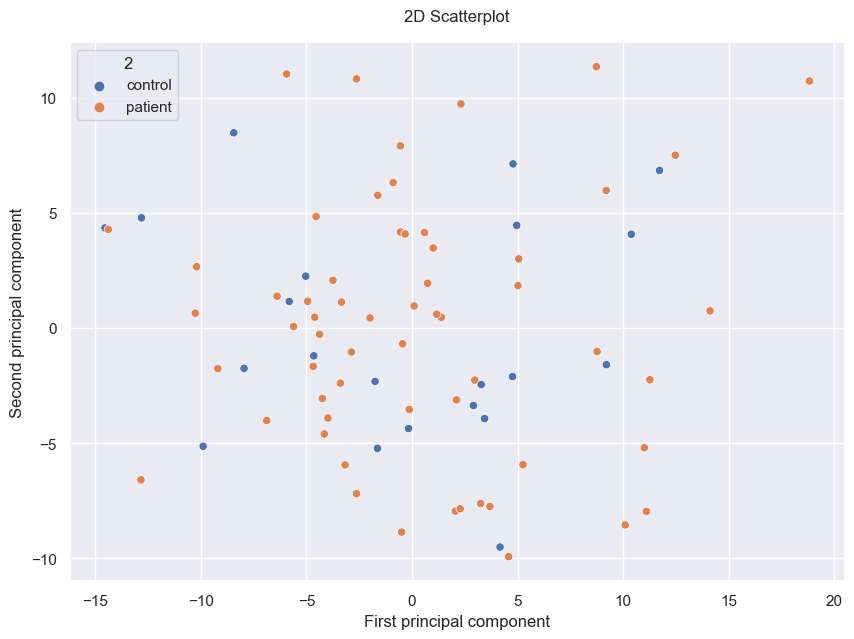

In [34]:
plt.figure(figsize=(10, 7))
sns.scatterplot(x=X_pca_2[:, 0], y=X_pca_2[:, 1], hue=df.iloc[:,2])
plt.title("2D Scatterplot", pad=15)
plt.xlabel("First principal component")
plt.ylabel("Second principal component")

In [23]:
c = []
for status in df.iloc[:,2]:
    if status == 'control':
        c.append('blue')
    else:
        c.append('orange')
print(c)

['blue', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'blue', 'orange', 'blue', 'orange', 'blue', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'blue', 'orange', 'blue', 'orange', 'blue', 'orange', 'blue', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'orange', 'blue', 'blue', 'orange', 'blue', 'orange']


Text(0.5, 0, 'Third principal component')

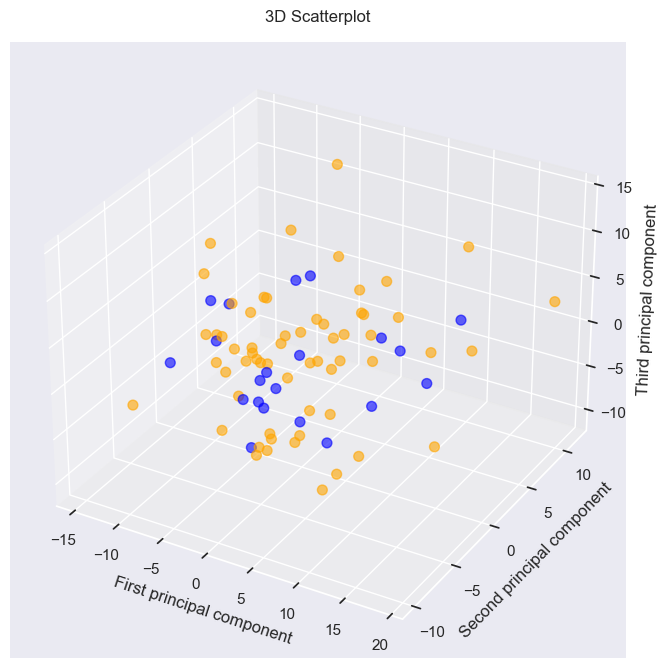

In [35]:
from mpl_toolkits import mplot3d

fig = plt.figure(figsize = (12, 8))
ax = plt.axes (projection='3d')
sctt = ax.scatter3D(X_pca_3[:, 0], X_pca_3[:, 1], X_pca_3[:, 2], c = c, s=50, alpha=0.6)
plt.title("3D Scatterplot", pad=15)
ax.set_xlabel("First principal component")
ax.set_ylabel("Second principal component")
ax.set_zlabel("Third principal component")

## Mean and standard deviation

In [25]:

for i in range(228):
    print(results[i+2][0])
    values = np.asarray(results[i+2][1:], dtype=np.float32)
    mean = np.mean(values)
    print('Mean: ' + str(mean))
    std = np.std(values)
    print('Standard deviation: ' + str(std))
    print()

SN CROWN_PD_MAP
Mean: 654.56964
Standard deviation: 27.83539

SN_R CROWN_PD_MAP
Mean: 647.831
Standard deviation: 32.419106

SN_L CROWN_PD_MAP
Mean: 662.1684
Standard deviation: 29.019936

LC CROWN_PD_MAP
Mean: 714.263
Standard deviation: 46.250328

LC_R CROWN_PD_MAP
Mean: 698.2543
Standard deviation: 54.324356

LC_L CROWN_PD_MAP
Mean: 730.27167
Standard deviation: 60.198406

SN CROWN_R2S
Mean: 2583.7612
Standard deviation: 364.4968

SN_R CROWN_R2S
Mean: 2630.2466
Standard deviation: 409.62796

SN_L CROWN_R2S
Mean: 2531.3416
Standard deviation: 363.17178

LC CROWN_R2S
Mean: 1556.6854
Standard deviation: 258.86816

LC_R CROWN_R2S
Mean: 1607.5171
Standard deviation: 289.64166

LC_L CROWN_R2S
Mean: 1505.8538
Standard deviation: 299.8889

SN CROWN_R2S_A2
Mean: 3079.125
Standard deviation: 580.61725

SN_R CROWN_R2S_A2
Mean: 3123.8884
Standard deviation: 631.7358

SN_L CROWN_R2S_A2
Mean: 3028.6465
Standard deviation: 580.6006

LC CROWN_R2S_A2
Mean: 1649.9155
Standard deviation: 383.55063

LC

## Histogram

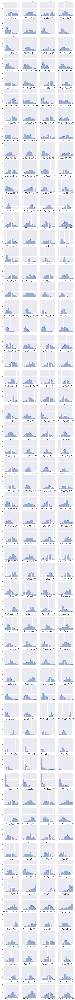

In [36]:
fig, axes = plt.subplots(57, 4, figsize=(14,199.5), sharey=True)
for j in range(57):
    for i in range(4):
        sns.histplot(ax=axes[j,i], x=np.asarray(results[4*j+i+2][1:], dtype=np.float32), kde=True)
        axes[j,i].set_title(results[4*j+i+2][0], size=10)

## Scatter plot

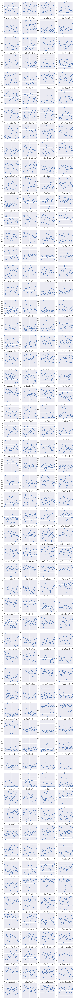

In [41]:
sns.set(font_scale=0.9)
fig, axes = plt.subplots(57, 4, figsize=(14,199.5))
for j in range(57):
    for i in range(4):
        sns.scatterplot(ax=axes[j,i], x=np.linspace(0, len(results[4*j+i+2][1:]), len(results[4*j+i+2][1:])) ,y=np.asarray(results[4*j+i+2][1:], dtype=np.float32))
        axes[j,i].set_title(results[4*j+i+2][0], size=10)

## Segmentation of SNpc and LC on T1WE image

In [27]:
import sys
import matplotlib.image as mpimg

In [28]:
sys.path.append(t1we_image_folder)
print(sys.path[-1])

/Users/signehogstad/masterproject/T1WE_2802


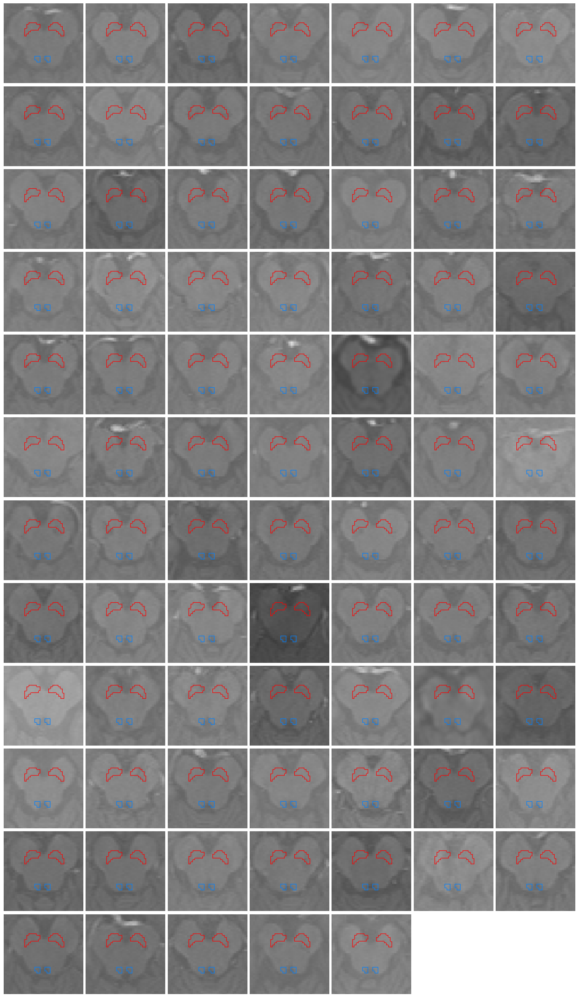

In [45]:
fig, axes = plt.subplots(12, 7, figsize=(20,35), sharey=True)
for path, directories, files in os.walk(sys.path[-1]):
    files.remove(".DS_Store")
    for file in files:
        img = mpimg.imread(t1we_image_folder + f"/{file}")
        index = files.index(file)
        j = index//7
        i = index%7
        axes[j,i].imshow(img)
        axes[j,i].axis('off')
        
axes[11,4].axis('off')
axes[11,5].axis('off')
axes[11,6].axis('off')
plt.subplots_adjust(wspace=0.03, hspace=-0.02)
#fig.savefig('../collage_T1WE_2802.png', bbox_inches='tight')

## Visual inspection of segmentation of SNpc and LC on T1WE image

(0.0, 1.0, 149.5, -0.5)

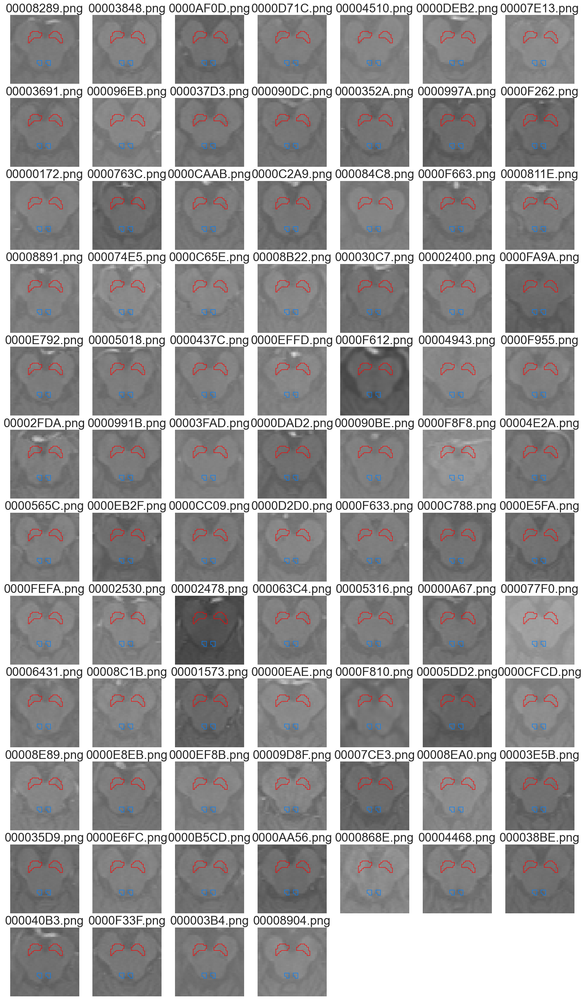

In [ ]:
fig, axes = plt.subplots(12, 7, figsize=(20,35), sharey=True)
for path, directories, files in os.walk(sys.path[-1]):
    for file in files:
        img = mpimg.imread(t1we_image_folder + f"/{file}")
        index = files.index(file)
        j = index//7
        i = index%7
        axes[j,i].imshow(img)
        axes[j,i].axis('off')
        axes[j,i].set_title(file)
        
axes[11,4].axis('off')
axes[11,5].axis('off')
axes[11,6].axis('off')